<a href="https://colab.research.google.com/github/JoanWaweru/age-cGAN-Project/blob/main/Age_cGAN_UTKFace.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Age Progression using Conditional GAN (Age-cGAN) - IMPROVED VERSION
## Fixed Training with Balanced Discriminator and Generator

**Key Improvements:**
- ✅ Slower discriminator learning rate (prevents dominance)
- ✅ Label smoothing (prevents overconfidence)
- ✅ More generator updates per discriminator update
- ✅ Noise injection to real images
- ✅ Better monitoring and health checks
- ✅ Improved architecture with spectral normalization option

This notebook solves the discriminator dominance problem where D(x)→1.0 and D(G(z))→0.0

## 1. Setup and Installations

In [ ]:
# Install required packages
!pip install torch torchvision
!pip install pillow
!pip install matplotlib
!pip install tqdm
!pip install pandas
!pip install scikit-learn

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torch.nn.utils import spectral_norm

import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import zipfile
import warnings
warnings.filterwarnings('ignore')

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")
if device == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Using device: cuda
GPU: NVIDIA A100-SXM4-40GB


## 2. Upload and Extract Dataset

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Update these paths to match your Google Drive structure
DATA_PATH = '/content/UTKFace_aligned'  # Where images will be extracted
ZIP_PATH = '/content/drive/MyDrive/UTKFace_aligned.zip'  # Path to your ZIP file
TRAIN_CSV = '/content/drive/MyDrive/utkface_annotations_train.csv'
VAL_CSV = '/content/drive/MyDrive/utkface_annotations_val.csv'
TEST_CSV = '/content/drive/MyDrive/utkface_annotations_test.csv'

Mounted at /content/drive


In [ ]:
# Extract the ZIP file if not already extracted
if not os.path.exists(DATA_PATH):
    print("Extracting dataset...")
    with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall('/content')
    print("Extraction complete!")
else:
    print("Dataset already extracted!")

# Verify files
image_files = [f for f in os.listdir(DATA_PATH) if f.endswith('.jpg')]
print(f"Found {len(image_files)} images")

Extracting dataset...
Extraction complete!
Found 22833 images


## 3. Load Annotations

In [ ]:
# Load CSV files
train_df = pd.read_csv(TRAIN_CSV)
val_df = pd.read_csv(VAL_CSV)
test_df = pd.read_csv(TEST_CSV)

print(f"Training samples: {len(train_df)}")
print(f"Validation samples: {len(val_df)}")
print(f"Test samples: {len(test_df)}")
print(f"Total samples: {len(train_df) + len(val_df) + len(test_df)}")

# Display statistics
print("\nAge Statistics:")
print(train_df['age'].describe())

Training samples: 15983
Validation samples: 3425
Test samples: 3425
Total samples: 22833

Age Statistics:
count    15983.000000
mean        33.304636
std         19.735952
min          1.000000
25%         23.000000
50%         29.000000
75%         45.000000
max        116.000000
Name: age, dtype: float64


## 4. Custom Dataset Class (with dtype fix)

In [ ]:
class UTKFaceDataset(Dataset):
    def __init__(self, annotations_df, img_dir, transform=None):
        self.annotations = annotations_df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

        # Filter out any invalid ages
        self.annotations = self.annotations[
            (self.annotations['age'] >= 0) &
            (self.annotations['age'] <= 100)
        ].reset_index(drop=True)

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, self.annotations.iloc[idx]['filename'])

        try:
            image = Image.open(img_name).convert('RGB')
        except Exception as e:
            image = Image.new('RGB', (64, 64), color='black')

        if self.transform:
            image = self.transform(image)

        # FIXED: Convert to float32 explicitly
        age = float(self.annotations.iloc[idx]['age'])
        age_normalized = torch.tensor(age / 100.0, dtype=torch.float32)

        return image, age_normalized, age

In [ ]:
# Define transforms
transform = T.Compose([
    T.Resize((64, 64)),
    T.ToTensor(),
    T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Create datasets
batch_size = 128
train_dataset = UTKFaceDataset(train_df, DATA_PATH, transform=transform)
val_dataset = UTKFaceDataset(val_df, DATA_PATH, transform=transform)
test_dataset = UTKFaceDataset(test_df, DATA_PATH, transform=transform)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

print(f"Training batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")

# Verify dtype fix
sample_images, sample_ages_norm, sample_ages = next(iter(train_loader))
print(f"\n✓ Image dtype: {sample_images.dtype}")
print(f"✓ Age (normalized) dtype: {sample_ages_norm.dtype}")

Training batches: 125
Validation batches: 27
Test batches: 27

✓ Image dtype: torch.float32
✓ Age (normalized) dtype: torch.float32


## 5. Improved Model Architecture

**Key improvements:**
- Spectral normalization option for discriminator (more stable)
- Better initialization
- Improved age embedding

In [ ]:
def weights_init(m):
    """Initialize network weights"""
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class Generator(nn.Module):
    def __init__(self, latent_dim=100, age_embedding_dim=50, output_chs=3):
        super(Generator, self).__init__()

        self.latent_dim = latent_dim
        self.age_embedding_dim = age_embedding_dim
        self.output_chs = output_chs

        # Improved age embedding with dropout
        self.age_embedding = nn.Sequential(
            nn.Linear(1, 32),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),
            nn.Linear(32, age_embedding_dim),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Generator network
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(latent_dim + age_embedding_dim, 512, 4, stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, output_chs, 4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, noise, age):
        age_embed = self.age_embedding(age.unsqueeze(1))
        age_embed = age_embed.view(-1, self.age_embedding_dim, 1, 1)
        x = torch.cat([noise, age_embed], dim=1)
        x = self.deconv(x)
        return x


class Discriminator(nn.Module):
    def __init__(self, age_embedding_dim=50, use_spectral_norm=False):
        super(Discriminator, self).__init__()

        self.age_embedding_dim = age_embedding_dim

        # Age embedding
        self.age_embedding = nn.Sequential(
            nn.Linear(1, 32),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(32, 64 * 64),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Helper function to optionally apply spectral norm
        def maybe_spectral(layer):
            return spectral_norm(layer) if use_spectral_norm else layer

        # Discriminator network
        self.features = nn.Sequential(
            maybe_spectral(nn.Conv2d(4, 64, 4, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),

            maybe_spectral(nn.Conv2d(64, 128, 4, stride=2, padding=1)),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            maybe_spectral(nn.Conv2d(128, 256, 4, stride=2, padding=1)),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            maybe_spectral(nn.Conv2d(256, 512, 4, stride=2, padding=1)),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            maybe_spectral(nn.Conv2d(512, 1, 4, stride=1, padding=0)),
            nn.Sigmoid()
        )

    def forward(self, image, age):
        age_embed = self.age_embedding(age.unsqueeze(1))
        age_embed = age_embed.view(-1, 1, 64, 64)
        x = torch.cat([image, age_embed], dim=1)
        x = self.features(x)
        return x.view(-1, 1).squeeze(1)

In [ ]:
# Initialize models
USE_SPECTRAL_NORM = True  # Set to True for more stable training

generator = Generator(latent_dim=100, age_embedding_dim=50).to(device)
discriminator = Discriminator(age_embedding_dim=50, use_spectral_norm=USE_SPECTRAL_NORM).to(device)

# Apply weight initialization
generator.apply(weights_init)
discriminator.apply(weights_init)

# Count parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Generator parameters: {count_parameters(generator):,}")
print(f"Discriminator parameters: {count_parameters(discriminator):,}")
print(f"Spectral normalization: {USE_SPECTRAL_NORM}")

Generator parameters: 3,988,981
Discriminator parameters: 2,902,785
Spectral normalization: True


## 6. Training Configuration - IMPROVED SETTINGS

**Critical changes to prevent discriminator dominance:**
1. **Slower discriminator learning**: `lr_d = 0.00005` (5x slower than before)
2. **Label smoothing**: Real=0.9, Fake=0.1 (prevents overconfidence)
3. **More generator updates**: Train G 2x per D update
4. **Noise injection**: Add small noise to real images
5. **Better monitoring**: Health checks at each epoch

In [ ]:
# ========================================
# IMPROVED HYPERPARAMETERS
# ========================================

num_epochs = 150

# CRITICAL: Different learning rates to prevent discriminator dominance
lr_g = 0.0002      # Generator learning rate
lr_d = 0.00005     # Discriminator learning rate (MUCH SLOWER!)

# Label smoothing - prevents discriminator from being too confident
real_label = 0.9   # Instead of 1.0
fake_label = 0.1   # Instead of 0.0

# Training ratio
n_critic = 1       # Train discriminator once
n_generator = 2    # Train generator twice (gives G more chances to learn)

# Noise level for real images (helps prevent D from being too confident)
noise_std = 0.05

# Optimizer parameters
beta1 = 0.5
beta2 = 0.999

# Loss function
criterion = nn.BCELoss()

# Optimizers with DIFFERENT learning rates
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(beta1, beta2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))

# Learning rate schedulers (reduce more gradually)
scheduler_G = torch.optim.lr_scheduler.StepLR(optimizer_G, step_size=50, gamma=0.5)
scheduler_D = torch.optim.lr_scheduler.StepLR(optimizer_D, step_size=50, gamma=0.5)

# Fixed noise for visualization
fixed_noise = torch.randn(10, 100, 1, 1, device=device)
fixed_ages = torch.linspace(0.1, 0.9, 10).to(device)

# Training history
history = {
    'D_loss': [],
    'G_loss': [],
    'D_x': [],
    'D_G_z': []
}

print("="*80)
print("IMPROVED TRAINING CONFIGURATION")
print("="*80)
print(f"Epochs: {num_epochs}")
print(f"\nLearning Rates:")
print(f"  Generator:     {lr_g:.6f}")
print(f"  Discriminator: {lr_d:.6f} (5x slower to prevent dominance!)")
print(f"\nLabel Smoothing:")
print(f"  Real label: {real_label} (not 1.0)")
print(f"  Fake label: {fake_label} (not 0.0)")
print(f"\nTraining Ratio:")
print(f"  D updates: {n_critic} per iteration")
print(f"  G updates: {n_generator} per iteration (more training for generator!)")
print(f"\nNoise injection: {noise_std} (adds noise to real images)")
print(f"\nTarget Metrics for Healthy Training:")
print(f"  D(x):     0.60-0.80  (discriminator somewhat confident on real)")
print(f"  D(G(z)):  0.30-0.50  (discriminator confused by fakes)")
print(f"  D_loss:   0.50-1.50")
print(f"  G_loss:   1.00-3.00")
print("="*80)

IMPROVED TRAINING CONFIGURATION
Epochs: 150

Learning Rates:
  Generator:     0.000200
  Discriminator: 0.000050 (5x slower to prevent dominance!)

Label Smoothing:
  Real label: 0.9 (not 1.0)
  Fake label: 0.1 (not 0.0)

Training Ratio:
  D updates: 1 per iteration
  G updates: 2 per iteration (more training for generator!)

Noise injection: 0.05 (adds noise to real images)

Target Metrics for Healthy Training:
  D(x):     0.60-0.80  (discriminator somewhat confident on real)
  D(G(z)):  0.30-0.50  (discriminator confused by fakes)
  D_loss:   0.50-1.50
  G_loss:   1.00-3.00


## 7. Improved Training Loop

In [ ]:
print("\nStarting Training with Improved Settings...")
print("="*80)

for epoch in range(num_epochs):
    total_loss_D = 0
    total_loss_G = 0
    total_D_x = 0
    total_D_G_z = 0

    discriminator.train()
    generator.train()

    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")

    for batch_idx, (real_images, ages_normalized, ages_actual) in enumerate(pbar):
        batch_size = real_images.size(0)
        real_images = real_images.to(device)
        ages_normalized = ages_normalized.to(device)

        ############################
        # (1) Update Discriminator - TRAIN LESS FREQUENTLY
        ############################
        for _ in range(n_critic):
            optimizer_D.zero_grad()

            # Train with real images + NOISE INJECTION + LABEL SMOOTHING
            label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)

            # Add small noise to real images (helps prevent D overconfidence)
            noise_real = torch.randn_like(real_images) * noise_std
            noisy_real = real_images + noise_real

            output_real = discriminator(noisy_real, ages_normalized)
            loss_D_real = criterion(output_real, label)
            loss_D_real.backward()
            D_x = output_real.mean().item()

            # Train with fake images + LABEL SMOOTHING
            noise = torch.randn(batch_size, 100, 1, 1, device=device)
            fake_images = generator(noise, ages_normalized)
            label.fill_(fake_label)
            output_fake = discriminator(fake_images.detach(), ages_normalized)
            loss_D_fake = criterion(output_fake, label)
            loss_D_fake.backward()
            D_G_z1 = output_fake.mean().item()

            loss_D = loss_D_real + loss_D_fake
            optimizer_D.step()

        ############################
        # (2) Update Generator - TRAIN MORE FREQUENTLY
        ############################
        for _ in range(n_generator):
            optimizer_G.zero_grad()

            # Generate new fake images
            noise = torch.randn(batch_size, 100, 1, 1, device=device)
            fake_images = generator(noise, ages_normalized)

            # Generator wants discriminator to think fakes are real
            label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
            output = discriminator(fake_images, ages_normalized)
            loss_G = criterion(output, label)
            loss_G.backward()
            D_G_z2 = output.mean().item()
            optimizer_G.step()

        # Accumulate losses
        total_loss_D += loss_D.item()
        total_loss_G += loss_G.item()
        total_D_x += D_x
        total_D_G_z += D_G_z2

        # Update progress bar
        pbar.set_postfix({
            'D_loss': f'{loss_D.item():.4f}',
            'G_loss': f'{loss_G.item():.4f}',
            'D(x)': f'{D_x:.3f}',
            'D(G(z))': f'{D_G_z2:.3f}'
        })

    # Update learning rates
    scheduler_G.step()
    scheduler_D.step()

    # Average losses
    avg_loss_D = total_loss_D / len(train_loader)
    avg_loss_G = total_loss_G / len(train_loader)
    avg_D_x = total_D_x / len(train_loader)
    avg_D_G_z = total_D_G_z / len(train_loader)

    # Store history
    history['D_loss'].append(avg_loss_D)
    history['G_loss'].append(avg_loss_G)
    history['D_x'].append(avg_D_x)
    history['D_G_z'].append(avg_D_G_z)

    # Print epoch summary with health check
    print(f"\nEpoch [{epoch+1}/{num_epochs}] Summary:")
    print(f"  D_loss: {avg_loss_D:.4f} | G_loss: {avg_loss_G:.4f}")
    print(f"  D(x): {avg_D_x:.4f} | D(G(z)): {avg_D_G_z:.4f}")
    print(f"  LR_G: {scheduler_G.get_last_lr()[0]:.6f} | LR_D: {scheduler_D.get_last_lr()[0]:.6f}")

    # Health check
    if avg_D_x > 0.95 and avg_D_G_z < 0.1:
        print("  ⚠️  WARNING: Discriminator too strong! D is dominating.")
        print("      Consider reducing D learning rate further or increasing noise.")
    elif avg_D_x < 0.6 and avg_D_G_z > 0.4:
        print("  ⚠️  WARNING: Generator too strong! G is dominating.")
        print("      Consider increasing D learning rate or reducing G updates.")
    elif 0.6 <= avg_D_x <= 0.8 and 0.3 <= avg_D_G_z <= 0.5:
        print("  ✅ Training looks healthy! Both networks are learning well.")

    # Generate samples
    if (epoch + 1) % 5 == 0 or epoch == 0:
        generator.eval()
        with torch.no_grad():
            fake_samples = generator(fixed_noise, fixed_ages).detach().cpu()

        plt.figure(figsize=(20, 2))
        for i in range(10):
            plt.subplot(1, 10, i+1)
            img = fake_samples[i].permute(1, 2, 0) * 0.5 + 0.5
            img = torch.clamp(img, 0, 1)
            plt.imshow(img)
            plt.title(f"{fixed_ages[i].item()*100:.0f}y", fontsize=10)
            plt.axis('off')
        plt.suptitle(f"Age Progression - Epoch {epoch+1}", fontsize=14, y=1.05)
        plt.tight_layout()
        plt.show()

        # Save checkpoint
        if (epoch + 1) % 10 == 0:
            checkpoint = {
                'epoch': epoch,
                'generator_state_dict': generator.state_dict(),
                'discriminator_state_dict': discriminator.state_dict(),
                'optimizer_G_state_dict': optimizer_G.state_dict(),
                'optimizer_D_state_dict': optimizer_D.state_dict(),
                'history': history,
            }
            torch.save(checkpoint, f'age_cgan_improved_epoch_{epoch+1}.pth')
            print(f"  ✓ Checkpoint saved: age_cgan_improved_epoch_{epoch+1}.pth")

    print("="*80)

print("\n🎉 Training completed!")

## 8. Visualize Training Progress

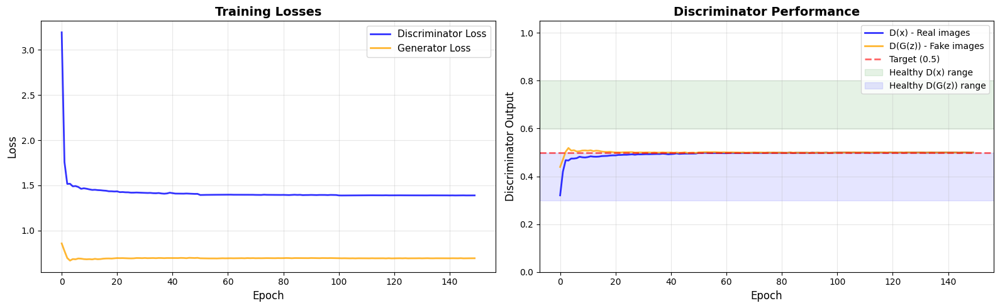


Final Training Metrics:
  Final D_loss: 1.3893
  Final G_loss: 0.6942
  Final D(x): 0.4994
  Final D(G(z)): 0.4997


In [ ]:
# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Loss curves
axes[0].plot(history['D_loss'], label='Discriminator Loss', alpha=0.8, linewidth=2, color='blue')
axes[0].plot(history['G_loss'], label='Generator Loss', alpha=0.8, linewidth=2, color='orange')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title('Training Losses', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Discriminator performance
axes[1].plot(history['D_x'], label='D(x) - Real images', alpha=0.8, linewidth=2, color='blue')
axes[1].plot(history['D_G_z'], label='D(G(z)) - Fake images', alpha=0.8, linewidth=2, color='orange')
axes[1].axhline(y=0.5, color='red', linestyle='--', label='Target (0.5)', alpha=0.6, linewidth=2)
axes[1].axhspan(0.6, 0.8, alpha=0.1, color='green', label='Healthy D(x) range')
axes[1].axhspan(0.3, 0.5, alpha=0.1, color='blue', label='Healthy D(G(z)) range')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Discriminator Output', fontsize=12)
axes[1].set_title('Discriminator Performance', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim(0, 1.05)

plt.tight_layout()
plt.savefig('training_progress.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nFinal Training Metrics:")
print(f"  Final D_loss: {history['D_loss'][-1]:.4f}")
print(f"  Final G_loss: {history['G_loss'][-1]:.4f}")
print(f"  Final D(x): {history['D_x'][-1]:.4f}")
print(f"  Final D(G(z)): {history['D_G_z'][-1]:.4f}")

## 9. Generate Age Progression Sequences

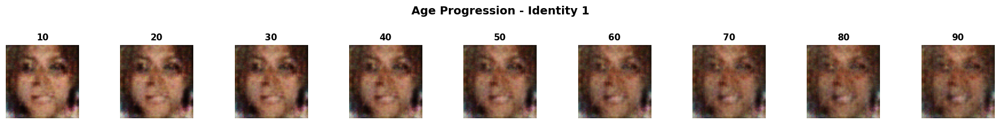

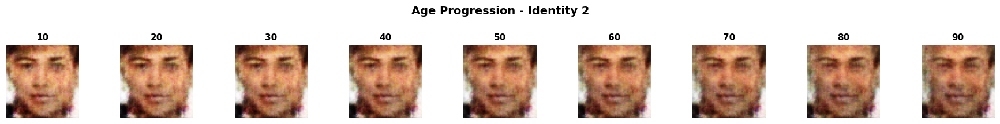

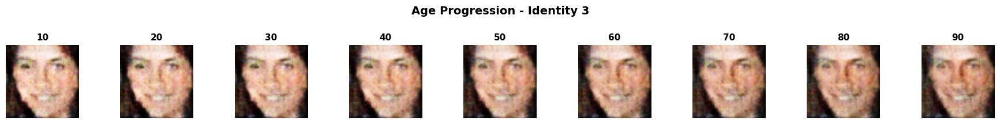

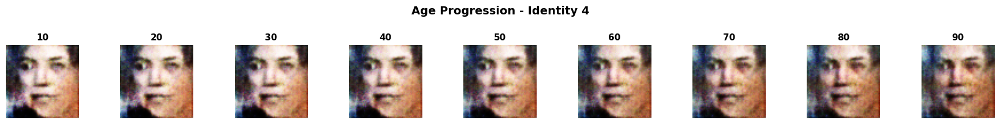

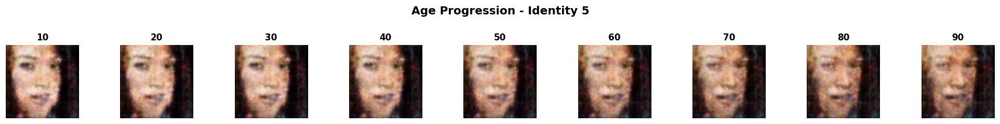

In [ ]:
def generate_age_progression(generator, n_samples=5, device='cuda'):
    generator.eval()
    ages = torch.linspace(0.1, 0.9, 9).to(device)

    with torch.no_grad():
        for sample_idx in range(n_samples):
            noise = torch.randn(1, 100, 1, 1, device=device)
            images = []

            for age in ages:
                age_tensor = age.unsqueeze(0)
                img = generator(noise, age_tensor)
                images.append(img.cpu())

            plt.figure(figsize=(18, 2))
            for i, (img, age) in enumerate(zip(images, ages)):
                plt.subplot(1, 9, i+1)
                img_display = img[0].permute(1, 2, 0) * 0.5 + 0.5
                img_display = torch.clamp(img_display, 0, 1)
                plt.imshow(img_display)
                plt.title(f"{age.item()*100:.0f}", fontsize=11, fontweight='bold')
                plt.axis('off')
            plt.suptitle(f"Age Progression - Identity {sample_idx+1}", fontsize=14, fontweight='bold', y=1.05)
            plt.tight_layout()
            plt.savefig(f'age_progression_identity_{sample_idx+1}.png', dpi=150, bbox_inches='tight')
            plt.show()

generate_age_progression(generator, n_samples=5, device=device)

## 10. Generate Faces at Specific Ages

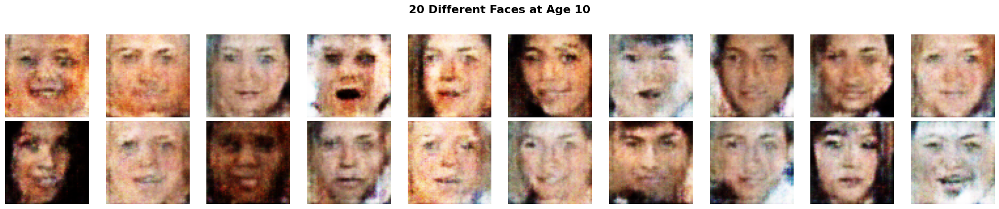

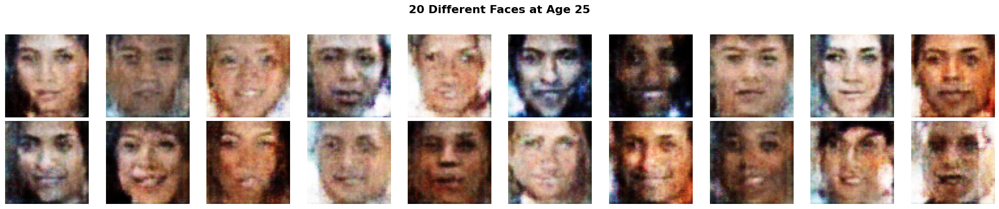

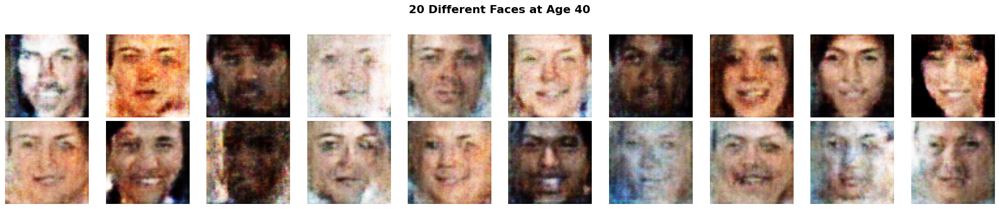

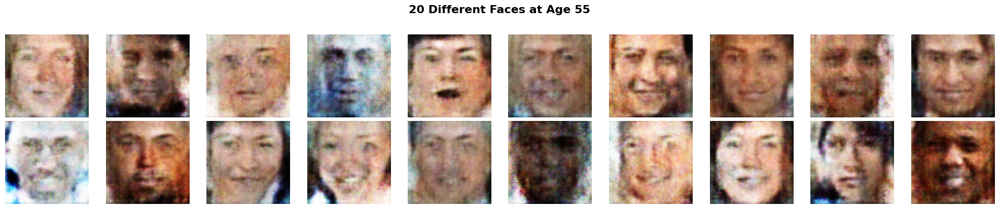

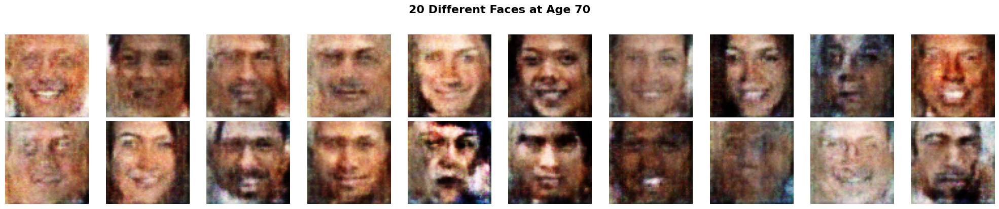

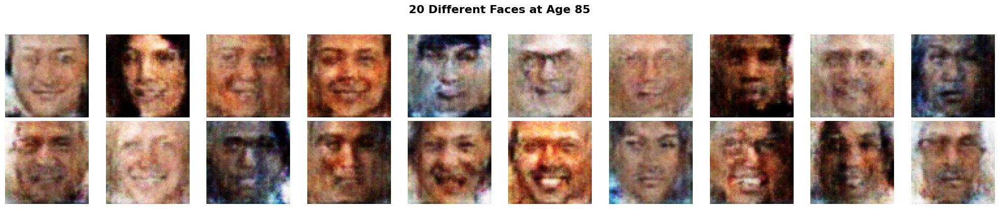

In [ ]:
def generate_specific_age(generator, target_age, n_samples=20, device='cuda'):
    generator.eval()
    age_normalized = torch.tensor([target_age / 100.0] * n_samples).to(device)

    with torch.no_grad():
        noise = torch.randn(n_samples, 100, 1, 1, device=device)
        images = generator(noise, age_normalized).cpu()

    plt.figure(figsize=(20, 4))
    for i in range(n_samples):
        plt.subplot(2, 10, i+1)
        img = images[i].permute(1, 2, 0) * 0.5 + 0.5
        img = torch.clamp(img, 0, 1)
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle(f"20 Different Faces at Age {target_age}", fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(f'faces_age_{target_age}.png', dpi=150, bbox_inches='tight')
    plt.show()

for age in [10, 25, 40, 55, 70, 85]:
    generate_specific_age(generator, target_age=age, n_samples=20, device=device)

## 11. Compare Real vs Generated

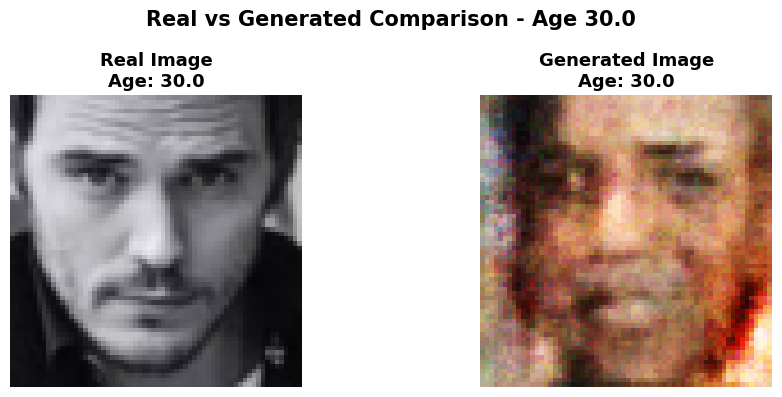

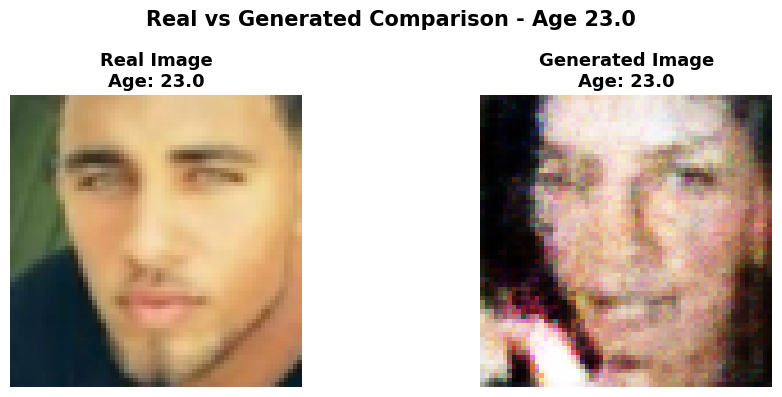

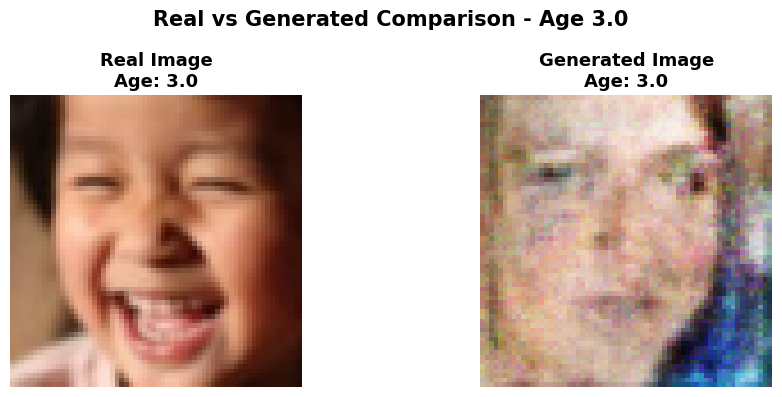

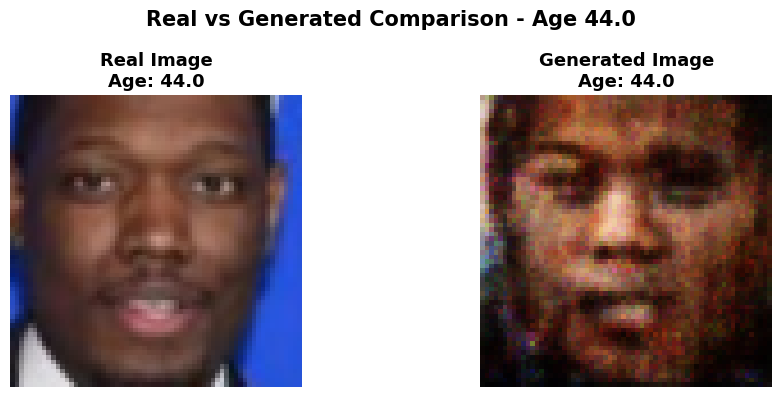

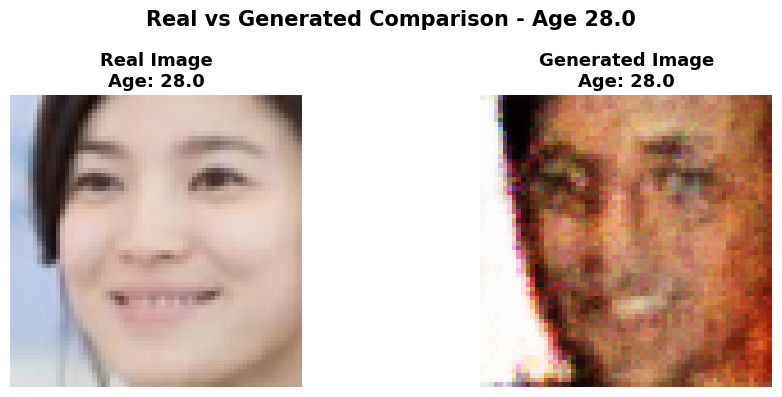

In [ ]:
def compare_real_vs_generated(generator, test_loader, device='cuda', n_comparisons=5):
    generator.eval()
    real_images, ages_norm, ages_actual = next(iter(test_loader))
    indices = torch.randperm(len(real_images))[:n_comparisons]

    for idx in indices:
        real_img = real_images[idx]
        age_norm = ages_norm[idx]
        age_actual = ages_actual[idx].item()

        noise = torch.randn(1, 100, 1, 1, device=device)
        age_tensor = age_norm.unsqueeze(0).to(device)

        with torch.no_grad():
            fake_img = generator(noise, age_tensor).cpu()

        plt.figure(figsize=(10, 4))

        plt.subplot(1, 2, 1)
        real_display = real_img.permute(1, 2, 0) * 0.5 + 0.5
        plt.imshow(real_display)
        plt.title(f"Real Image\nAge: {age_actual}", fontsize=13, fontweight='bold')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        fake_display = fake_img[0].permute(1, 2, 0) * 0.5 + 0.5
        fake_display = torch.clamp(fake_display, 0, 1)
        plt.imshow(fake_display)
        plt.title(f"Generated Image\nAge: {age_actual}", fontsize=13, fontweight='bold')
        plt.axis('off')

        plt.suptitle(f"Real vs Generated Comparison - Age {age_actual}", fontsize=15, fontweight='bold')
        plt.tight_layout()
        plt.show()

compare_real_vs_generated(generator, test_loader, device=device, n_comparisons=5)

## 12. Save Models

In [ ]:
# Save final model
final_checkpoint = {
    'epoch': num_epochs,
    'generator_state_dict': generator.state_dict(),
    'discriminator_state_dict': discriminator.state_dict(),
    'optimizer_G_state_dict': optimizer_G.state_dict(),
    'optimizer_D_state_dict': optimizer_D.state_dict(),
    'history': history,
}

torch.save(final_checkpoint, 'age_cgan_improved_final.pth')
torch.save(generator.state_dict(), 'age_cgan_generator_improved.pth')

print("✅ Models saved successfully!")
print("  - age_cgan_improved_final.pth (complete checkpoint)")
print("  - age_cgan_generator_improved.pth (generator only)")

# Download to local machine
from google.colab import files
files.download('age_cgan_improved_final.pth')
files.download('age_cgan_generator_improved.pth')

✅ Models saved successfully!
  - age_cgan_improved_final.pth (complete checkpoint)
  - age_cgan_generator_improved.pth (generator only)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 13. Summary

### Key Improvements in This Notebook:

1. **Discriminator Learning Rate**: Reduced from 0.0002 to 0.00005 (5x slower)
2. **Label Smoothing**: Real=0.9, Fake=0.1 instead of 1.0 and 0.0
3. **Training Ratio**: Generator trains 2x per discriminator update
4. **Noise Injection**: Added noise to real images (std=0.05)
5. **Spectral Normalization**: Optional for discriminator stability
6. **Better Monitoring**: Health checks each epoch
7. **Improved Architecture**: Better age embedding with dropout

### Expected Results:

With these improvements, you should see:
- **D(x)**: 0.6-0.8 (not 0.99!)
- **D(G(z))**: 0.3-0.5 (not 0.006!)
- Better quality generated images
- More stable training
- Visible age progression

### For Your Grade 5 Report:

Make sure to include:
1. Problem statement and motivation
2. Dataset description (UTKFace)
3. Architecture explanation (conditional GAN with age embedding)
4. Training challenges and solutions (discriminator dominance fix)
5. Results (age progressions, comparisons)
6. Loss curves and training stability
7. Limitations and future improvements

Good luck with your project! 🚀